# Modelo TPH

In [1]:
# Modelo TPH
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import lightgbm as lgb
import xgboost as xgb
#import d3rlpy
from tqdm.notebook import tqdm_notebook
from tqdm import tqdm

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pickle
import seaborn as sns
from datetime import datetime
from datetime import timedelta
import re
from dateutil.parser import parse
import string
import warnings
warnings.filterwarnings('ignore')
import plotly.graph_objects as go
from sklearn.metrics import mean_absolute_percentage_error
import missingno as msno
from plotly.subplots import make_subplots
from sklearn.preprocessing import MinMaxScaler
import scipy
import researchpy as rp
from matplotlib.offsetbox import AnchoredText
#import pacmap
from sklearn.compose import ColumnTransformer
from sklearn.cluster import KMeans
from sklearn.pipeline import Pipeline
import plotly.express as px
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from imblearn.over_sampling import RandomOverSampler
from sklearn.model_selection import train_test_split 
# Import Halving Grid Search
from sklearn.experimental import enable_halving_search_cv 
from sklearn.model_selection import HalvingGridSearchCV
import xgboost as xgb
from scipy.stats import kurtosis,skew
from numpy import mean,sqrt,square
from scipy.fftpack import fft, fftfreq
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import PredefinedSplit
import shap
sns.set_style("darkgrid")
pd.set_option('display.max_columns', None)
pd.options.display.max_colwidth = 100

In [4]:
df_fe = pd.read_csv("../../data/processed data/feature_engineering_08September2023.csv",parse_dates=['Timestamp'], index_col='Timestamp')
df_fe.head(1)

,granulometry,charge cell,speed,solid percentage,water,TPH,HH TPH,LL charge cell,HH charge cell,loss of TPH,start loss of TPH,end loss of TPH,start low load cell,end low load cell,start high load cell,end high load cell,delta HH TPH,delta HH charge cell,high load cell,low load cell,pyrite law,chalcopyrite law,chalcocite law,crusher index,sag power index,ball work index,bornite law,covelin law,Edad,mean_granulometry_10,max_granulometry_10,min_granulometry_10,rms_granulometry_10,var_granulometry_10,mean_granulometry_5,max_granulometry_5,min_granulometry_5,rms_granulometry_5,var_granulometry_5,mean_granulometry_3,max_granulometry_3,min_granulometry_3,rms_granulometry_3,var_granulometry_3,mean_charge cell_10,max_charge cell_10,min_charge cell_10,rms_charge cell_10,var_charge cell_10,mean_charge cell_5,max_charge cell_5,min_charge cell_5,rms_charge cell_5,var_charge cell_5,mean_charge cell_3,max_charge cell_3,min_charge cell_3,rms_charge cell_3,var_charge cell_3,mean_speed_10,max_speed_10,min_speed_10,rms_speed_10,var_speed_10,mean_speed_5,max_speed_5,min_speed_5,rms_speed_5,var_speed_5,mean_speed_3,max_speed_3,min_speed_3,rms_speed_3,var_speed_3,mean_solid percentage_10,max_solid percentage_10,min_solid percentage_10,rms_solid percentage_10,var_solid percentage_10,mean_solid percentage_5,max_solid percentage_5,min_solid percentage_5,rms_solid percentage_5,var_solid percentage_5,mean_solid percentage_3,max_solid percentage_3,min_solid percentage_3,rms_solid percentage_3,var_solid percentage_3,mean_water_10,max_water_10,min_water_10,rms_water_10,var_water_10,mean_water_5,max_water_5,min_water_5,rms_water_5,var_water_5,mean_water_3,max_water_3,min_water_3,rms_water_3,var_water_3,mean_TPH_10,max_TPH_10,min_TPH_10,rms_TPH_10,var_TPH_10,mean_TPH_5,max_TPH_5,min_TPH_5,rms_TPH_5,var_TPH_5,mean_TPH_3,max_TPH_3,min_TPH_3,rms_TPH_3,var_TPH_3,mean_HH TPH_10,max_HH TPH_10,min_HH TPH_10,rms_HH TPH_10,var_HH TPH_10,mean_HH TPH_5,max_HH TPH_5,min_HH TPH_5,rms_HH TPH_5,var_HH TPH_5,mean_HH TPH_3,max_HH TPH_3,min_HH TPH_3,rms_HH TPH_3,var_HH TPH_3,mean_LL charge cell_10,max_LL charge cell_10,min_LL charge cell_10,rms_LL charge cell_10,var_LL charge cell_10,mean_LL charge cell_5,max_LL charge cell_5,min_LL charge cell_5,rms_LL charge cell_5,var_LL charge cell_5,mean_LL charge cell_3,max_LL charge cell_3,min_LL charge cell_3,rms_LL charge cell_3,var_LL charge cell_3,mean_HH charge cell_10,max_HH charge cell_10,min_HH charge cell_10,rms_HH charge cell_10,var_HH charge cell_10,mean_HH charge cell_5,max_HH charge cell_5,min_HH charge cell_5,rms_HH charge cell_5,var_HH charge cell_5,mean_HH charge cell_3,max_HH charge cell_3,min_HH charge cell_3,rms_HH charge cell_3,var_HH charge cell_3,mean_delta HH TPH_10,max_delta HH TPH_10,min_delta HH TPH_10,rms_delta HH TPH_10,var_delta HH TPH_10,mean_delta HH TPH_5,max_delta HH TPH_5,min_delta HH TPH_5,rms_delta HH TPH_5,var_delta HH TPH_5,mean_delta HH TPH_3,max_delta HH TPH_3,min_delta HH TPH_3,rms_delta HH TPH_3,var_delta HH TPH_3,mean_delta HH charge cell_10,max_delta HH charge cell_10,min_delta HH charge cell_10,rms_delta HH charge cell_10,var_delta HH charge cell_10,mean_delta HH charge cell_5,max_delta HH charge cell_5,min_delta HH charge cell_5,rms_delta HH charge cell_5,var_delta HH charge cell_5,mean_delta HH charge cell_3,max_delta HH charge cell_3,min_delta HH charge cell_3,rms_delta HH charge cell_3,var_delta HH charge cell_3,mean_sag power index_10,max_sag power index_10,min_sag power index_10,rms_sag power index_10,var_sag power index_10,mean_sag power index_5,max_sag power index_5,min_sag power index_5,rms_sag power index_5,var_sag power index_5,mean_sag power index_3,max_sag power index_3,min_sag power index_3,rms_sag power index_3,var_sag power index_3,mean_Edad_10,max_Edad_10,min_Edad_10,rms_Edad_10,var_Edad_10,mean_Edad_5,max_Edad_5,min_Edad_5,rms_Edad_5,var_Edad_5,mean_Edad_3,max_Edad_3,min_Edad_3,rms_Edad_3,var_Edad_3,granulometry_(t-1),granulometry_(t-2),granulometry_(t-3),granulometry_(t-4)

In [4]:
df_fe["Edad"]=df_fe["Edad"].astype("category")

In [3]:
df_events = pd.read_csv("../../data/processed data/events_08September2023.csv")
df_events.head(1)

,inicio perdida,fin perdida,inicio evento,fin evento,impacto TPH,variación HH TPH,std HH TPH,Causalidad sistema de control,Causalidad molino vacio,Tipo de evento,Flag,duración evento
0,2018-01-01 00:51:00,2018-01-01 01:30:00,2018-01-01 00:41:00,2018-01-01 01:40:00,6.131858,False,0.0,False,False,Embancamiento,E,39.0


In [4]:
df_events_train=df_events[(df_events["Flag"]=="E") | (df_events["Flag"]=="S")]
df_events_train.head(1)

,inicio perdida,fin perdida,inicio evento,fin evento,impacto TPH,variación HH TPH,std HH TPH,Causalidad sistema de control,Causalidad molino vacio,Tipo de evento,Flag,duración evento
0,2018-01-01 00:51:00,2018-01-01 01:30:00,2018-01-01 00:41:00,2018-01-01 01:40:00,6.131858,False,0.0,False,False,Embancamiento,E,39.0


In [5]:
tags=['granulometry', 'charge cell', 'speed', 'solid percentage', 'water','TPH', 'HH TPH', 'LL charge cell', 'HH charge cell',

#"loss of TPH","start loss of TPH"	,"end loss of TPH",		"start low load cell",	"end low load cell",		"start high load cell",	"end high load cell","high load cell","low load cell",
#"Optimizando tonelaje","Limitado por Peso",
"delta HH TPH","delta HH charge cell",
#'pyrite law', 'chalcopyrite law','chalcocite law', 'crusher index', 'ball work index','bornite law','covelin law',
'sag power index',

"Edad"
]

In [ ]:
df_fe.reset_index(inplace=True)

In [9]:
df_full=pd.DataFrame()
# Concat perdidas de interes
for row in tqdm(df_events_train.iterrows(),desc="Progreso iteración perdidas de TPH"):

    df_range=df_fe[df_fe["Timestamp"].between(row[1]["inicio evento"],row[1]["fin evento"])]

    df_range["Flag"]=row[1]["Flag"]

    df_full=pd.concat([df_full,df_range])
    
# Concat estados de no perdida

#df_full=pd.concat([df_full,df_fe[df_fe["loss of TPH"]==0]])

Progreso iteración perdidas de TPH: 17it [00:00, 26.52it/s]

Progreso iteración perdidas de TPH: 7746it [25:10,  5.13it/s]


In [28]:
df_full.duplicated().sum()

0

In [13]:
df_full=df_full.drop_duplicates()

In [14]:
df_full.shape

(474175, 291)

In [16]:
df_full.to_csv("../../data/processed data/feature_engineering_event_to_train_09September2023.csv")

In [6]:
df_full=pd.read_csv("../../data/processed data/feature_engineering_event_to_train_09September2023.csv",parse_dates=['Timestamp'], index_col='Timestamp').drop(["Unnamed: 0"],axis=1)
df_full["TPH"]=df_full["TPH"].shift(-5)
df_full["loss of TPH"]=df_full["loss of TPH"].shift(-5)
df_full.dropna(inplace=True)
df_full.head()

,granulometry,charge cell,speed,solid percentage,water,TPH,HH TPH,LL charge cell,HH charge cell,loss of TPH,start loss of TPH,end loss of TPH,start low load cell,end low load cell,start high load cell,end high load cell,delta HH TPH,delta HH charge cell,high load cell,low load cell,pyrite law,chalcopyrite law,chalcocite law,crusher index,sag power index,ball work index,bornite law,covelin law,Edad,mean_granulometry_10,max_granulometry_10,min_granulometry_10,rms_granulometry_10,var_granulometry_10,mean_granulometry_5,max_granulometry_5,min_granulometry_5,rms_granulometry_5,var_granulometry_5,mean_granulometry_3,max_granulometry_3,min_granulometry_3,rms_granulometry_3,var_granulometry_3,mean_charge cell_10,max_charge cell_10,min_charge cell_10,rms_charge cell_10,var_charge cell_10,mean_charge cell_5,max_charge cell_5,min_charge cell_5,rms_charge cell_5,var_charge cell_5,mean_charge cell_3,max_charge cell_3,min_charge cell_3,rms_charge cell_3,var_charge cell_3,mean_speed_10,max_speed_10,min_speed_10,rms_speed_10,var_speed_10,mean_speed_5,max_speed_5,min_speed_5,rms_speed_5,var_speed_5,mean_speed_3,max_speed_3,min_speed_3,rms_speed_3,var_speed_3,mean_solid percentage_10,max_solid percentage_10,min_solid percentage_10,rms_solid percentage_10,var_solid percentage_10,mean_solid percentage_5,max_solid percentage_5,min_solid percentage_5,rms_solid percentage_5,var_solid percentage_5,mean_solid percentage_3,max_solid percentage_3,min_solid percentage_3,rms_solid percentage_3,var_solid percentage_3,mean_water_10,max_water_10,min_water_10,rms_water_10,var_water_10,mean_water_5,max_water_5,min_water_5,rms_water_5,var_water_5,mean_water_3,max_water_3,min_water_3,rms_water_3,var_water_3,mean_TPH_10,max_TPH_10,min_TPH_10,rms_TPH_10,var_TPH_10,mean_TPH_5,max_TPH_5,min_TPH_5,rms_TPH_5,var_TPH_5,mean_TPH_3,max_TPH_3,min_TPH_3,rms_TPH_3,var_TPH_3,mean_HH TPH_10,max_HH TPH_10,min_HH TPH_10,rms_HH TPH_10,var_HH TPH_10,mean_HH TPH_5,max_HH TPH_5,min_HH TPH_5,rms_HH TPH_5,var_HH TPH_5,mean_HH TPH_3,max_HH TPH_3,min_HH TPH_3,rms_HH TPH_3,var_HH TPH_3,mean_LL charge cell_10,max_LL charge cell_10,min_LL charge cell_10,rms_LL charge cell_10,var_LL charge cell_10,mean_LL charge cell_5,max_LL charge cell_5,min_LL charge cell_5,rms_LL charge cell_5,var_LL charge cell_5,mean_LL charge cell_3,max_LL charge cell_3,min_LL charge cell_3,rms_LL charge cell_3,var_LL charge cell_3,mean_HH charge cell_10,max_HH charge cell_10,min_HH charge cell_10,rms_HH charge cell_10,var_HH charge cell_10,mean_HH charge cell_5,max_HH charge cell_5,min_HH charge cell_5,rms_HH charge cell_5,var_HH charge cell_5,mean_HH charge cell_3,max_HH charge cell_3,min_HH charge cell_3,rms_HH charge cell_3,var_HH charge cell_3,mean_delta HH TPH_10,max_delta HH TPH_10,min_delta HH TPH_10,rms_delta HH TPH_10,var_delta HH TPH_10,mean_delta HH TPH_5,max_delta HH TPH_5,min_delta HH TPH_5,rms_delta HH TPH_5,var_delta HH TPH_5,mean_delta HH TPH_3,max_delta HH TPH_3,min_delta HH TPH_3,rms_delta HH TPH_3,var_delta HH TPH_3,mean_delta HH charge cell_10,max_delta HH charge cell_10,min_delta HH charge cell_10,rms_delta HH charge cell_10,var_delta HH charge cell_10,mean_delta HH charge cell_5,max_delta HH charge cell_5,min_delta HH charge cell_5,rms_delta HH charge cell_5,var_delta HH charge cell_5,mean_delta HH charge cell_3,max_delta HH charge cell_3,min_delta HH charge cell_3,rms_delta HH charge cell_3,var_delta HH charge cell_3,mean_sag power index_10,max_sag power index_10,min_sag power index_10,rms_sag power index_10,var_sag power index_10,mean_sag power index_5,max_sag power index_5,min_sag power index_5,rms_sag power index_5,var_sag power index_5,mean_sag power index_3,max_sag power index_3,min_sag power index_3,rms_sag power index_3,var_sag power index_3,mean_Edad_10,max_Edad_10,min_Edad_10,rms_Edad_10,var_Edad_10,mean_Edad_5,max_Edad_5,min_Edad_5,rms_Edad_5,var_Edad_5,mean_Edad_3,max_Edad_3,min_Edad_3,rms_Edad_3,var_Edad_3,granulometry_(t-1),granulometry_(t-2),granulometry_(t-3),granulometry_(t-4)

In [7]:
df_full["Edad"]=df_full["Edad"].astype("category")

In [8]:
#df_full=df_full.query("Flag=='''S'''")

In [9]:
others=[ 'start loss of TPH',
 'end loss of TPH',
 'start low load cell',
 'end low load cell',
 'start high load cell','end high load cell','high load cell',
 'low load cell','pyrite law', 'chalcopyrite law','chalcocite law', 
 'crusher index', 'ball work index','bornite law','covelin law',"Flag"]

In [10]:
df_full["loss of TPH"].value_counts()

1.0    277055
0.0     88421
Name: loss of TPH, dtype: int64

In [11]:
features1=["Edad","TPH","loss of TPH","HH TPH","random"]+[i for i in df_full.columns if (not re.match(".*water",i)) and (not re.match(".*delta HH TPH",i)) and (not re.match(".*Edad",i)) and (not re.match(".*TPH",i))]
features = list(set(features1).difference(set(others)))

In [12]:
df_full['random'] = np.random.rand(df_full.shape[0])

In [13]:
#df_full=df_full[features]

In [14]:
# Entrenamiento
entrenamiento=pd.concat([df_full["2020-01":"2020-03"],df_full["2020-05"],df_full["2020-07":"2020-12"],df_full["2021-01":"2021-08"],df_full["2021-10"],df_full["2021-12"]])[features]
entrenamiento.head(1)

,max_speed_3,mean_granulometry_5,max_charge cell_3,mean_solid percentage_10,min_sag power index_10,min_HH charge cell_5,HH charge cell_(t-3),min_sag power index_3,var_granulometry_10,max_solid percentage_5,mean_delta HH charge cell_10,min_LL charge cell_10,max_HH charge cell_10,rms_sag power index_3,var_speed_3,max_LL charge cell_5,min_speed_5,rms_solid percentage_3,sag power index_(t-2),HH charge cell_(t-2),rms_sag power index_10,rms_HH charge cell_3,max_LL charge cell_3,max_delta HH charge cell_10,max_speed_5,loss of TPH,var_charge cell_10,HH charge cell_(t-4),HH charge cell,max_solid percentage_3,var_granulometry_5,sag power index_(t-4),max_charge cell_5,rms_granulometry_10,solid percentage_(t-2),solid percentage_(t-3),max_granulometry_5,rms_delta HH charge cell_3,HH charge cell_(t-1),sag power index_(t-3),mean_sag power index_3,rms_solid percentage_5,charge cell_(t-5),speed_(t-5),min_LL charge cell_5,mean_HH charge cell_3,var_HH charge cell_10,rms_HH charge cell_5,var_delta HH charge cell_10,charge cell_(t-1),mean_speed_5,LL charge cell_(t-4),mean_HH charge cell_10,var_delta HH charge cell_5,max_delta HH charge cell_5,charge cell_(t-4),delta HH charge cell_(t-5),mean_LL charge cell_10,mean_speed_10,var_solid percentage_3,rms_LL charge cell_10,LL charge cell,max_speed_10,mean_solid percentage_5,rms_LL charge cell_3,mean_delta HH charge cell_5,HH TPH,var_delta HH charge cell_3,min_solid percentage_5,var_sag power index_5,speed_(t-2),delta HH charge cell_(t-2),var_solid percentage_5,mean_charge cell_3,rms_charge cell_5,Edad,min_delta HH charge cell_10,rms_delta HH charge cell_10,granulometry_(t-3),LL charge cell_(t-2),mean_charge cell_10,max_charge cell_10,rms_charge cell_10,min_speed_3,max_delta HH charge cell_3,random,var_speed_10,TPH,charge cell,delta HH charge cell_(t-4),solid percentage_(t-4),speed_(t-4),min_solid percentage_10,granulometry,min_LL charge cell_3,mean_HH charge cell_5,granulometry_(t-5),rms_speed_3,min_granulometry_10,mean_granulometry_10,rms_granulometry_3,mean_LL charge cell_3,var_LL charge cell_3,min_HH charge cell_10,max_granulometry_10,mean_sag power index_10,rms_delta HH charge cell_5,LL charge cell_(t-3),delta HH charge cell,min_speed_10,var_HH charge cell_3,mean_speed_3,delta HH charge cell_(t-3),sag power index_(t-1),rms_sag power index_5,max_sag power index_5,max_HH charge cell_3,min_charge cell_10,max_solid percentage_10,max_sag power index_10,rms_HH charge cell_10,var_sag power index_10,rms_speed_10,granulometry_(t-4),max_granulometry_3,rms_speed_5,var_LL charge cell_5,sag power index_(t-5),rms_solid percentage_10,min_delta HH charge cell_5,var_LL charge cell_10,speed,rms_LL charge cell_5,mean_sag power index_5,min_solid percentage_3,granulometry_(t-1),min_sag power index_5,min_charge cell_5,speed_(t-1),mean_LL charge cell_5,var_granulometry_3,HH charge cell_(t-5),min_HH charge cell_3,max_HH charge cell_5,mean_delta HH charge cell_3,granulometry_(t-2),LL charge cell_(t-5),solid percentage,LL charge cell_(t-1),var_charge cell_5,rms_charge cell_3,var_HH charge cell_5,var_charge cell_3,mean_granulometry_3,max_sag power index_3,min_delta HH charge cell_3,max_LL charge cell_10,charge cell_(t-3),sag power index,min_charge cell_3,speed_(t-3),rms_granulometry_5,min_granulometry_5,mean_solid percentage_3,min_granulometry_3,delta HH charge cell_(t-1),var_speed_5,solid percentage_(t-1),var_solid percentage_10,mean_charge cell_5,charge cell_(t-2),var_sag power index_3,solid percentage_(t-5)
Timestamp,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-10 01:55:00,9.249814,45.336206,821.121423,73.640117,98.5569,850.0,850.0,98.5569,0.009481,73.888991,34.978442,770.0,850.0,98.5569,2.296189e-08,770.0,9.249444,73.861002,98.5569,850.0,98.5569,850.0,770.0,39.367981,9.250532,0.0,12.260027,850.0,850.0,73.888991,0.013361,98.5569,821.121423,45.387341,73.859426,73.888403,45.472911,30.212076,

In [15]:
# Validación
validacion=pd.concat([df_full["2020-06"],df_full["2021-11"]])[features]
validacion.head(1)

,max_speed_3,mean_granulometry_5,max_charge cell_3,mean_solid percentage_10,min_sag power index_10,min_HH charge cell_5,HH charge cell_(t-3),min_sag power index_3,var_granulometry_10,max_solid percentage_5,mean_delta HH charge cell_10,min_LL charge cell_10,max_HH charge cell_10,rms_sag power index_3,var_speed_3,max_LL charge cell_5,min_speed_5,rms_solid percentage_3,sag power index_(t-2),HH charge cell_(t-2),rms_sag power index_10,rms_HH charge cell_3,max_LL charge cell_3,max_delta HH charge cell_10,max_speed_5,loss of TPH,var_charge cell_10,HH charge cell_(t-4),HH charge cell,max_solid percentage_3,var_granulometry_5,sag power index_(t-4),max_charge cell_5,rms_granulometry_10,solid percentage_(t-2),solid percentage_(t-3),max_granulometry_5,rms_delta HH charge cell_3,HH charge cell_(t-1),sag power index_(t-3),mean_sag power index_3,rms_solid percentage_5,charge cell_(t-5),speed_(t-5),min_LL charge cell_5,mean_HH charge cell_3,var_HH charge cell_10,rms_HH charge cell_5,var_delta HH charge cell_10,charge cell_(t-1),mean_speed_5,LL charge cell_(t-4),mean_HH charge cell_10,var_delta HH charge cell_5,max_delta HH charge cell_5,charge cell_(t-4),delta HH charge cell_(t-5),mean_LL charge cell_10,mean_speed_10,var_solid percentage_3,rms_LL charge cell_10,LL charge cell,max_speed_10,mean_solid percentage_5,rms_LL charge cell_3,mean_delta HH charge cell_5,HH TPH,var_delta HH charge cell_3,min_solid percentage_5,var_sag power index_5,speed_(t-2),delta HH charge cell_(t-2),var_solid percentage_5,mean_charge cell_3,rms_charge cell_5,Edad,min_delta HH charge cell_10,rms_delta HH charge cell_10,granulometry_(t-3),LL charge cell_(t-2),mean_charge cell_10,max_charge cell_10,rms_charge cell_10,min_speed_3,max_delta HH charge cell_3,random,var_speed_10,TPH,charge cell,delta HH charge cell_(t-4),solid percentage_(t-4),speed_(t-4),min_solid percentage_10,granulometry,min_LL charge cell_3,mean_HH charge cell_5,granulometry_(t-5),rms_speed_3,min_granulometry_10,mean_granulometry_10,rms_granulometry_3,mean_LL charge cell_3,var_LL charge cell_3,min_HH charge cell_10,max_granulometry_10,mean_sag power index_10,rms_delta HH charge cell_5,LL charge cell_(t-3),delta HH charge cell,min_speed_10,var_HH charge cell_3,mean_speed_3,delta HH charge cell_(t-3),sag power index_(t-1),rms_sag power index_5,max_sag power index_5,max_HH charge cell_3,min_charge cell_10,max_solid percentage_10,max_sag power index_10,rms_HH charge cell_10,var_sag power index_10,rms_speed_10,granulometry_(t-4),max_granulometry_3,rms_speed_5,var_LL charge cell_5,sag power index_(t-5),rms_solid percentage_10,min_delta HH charge cell_5,var_LL charge cell_10,speed,rms_LL charge cell_5,mean_sag power index_5,min_solid percentage_3,granulometry_(t-1),min_sag power index_5,min_charge cell_5,speed_(t-1),mean_LL charge cell_5,var_granulometry_3,HH charge cell_(t-5),min_HH charge cell_3,max_HH charge cell_5,mean_delta HH charge cell_3,granulometry_(t-2),LL charge cell_(t-5),solid percentage,LL charge cell_(t-1),var_charge cell_5,rms_charge cell_3,var_HH charge cell_5,var_charge cell_3,mean_granulometry_3,max_sag power index_3,min_delta HH charge cell_3,max_LL charge cell_10,charge cell_(t-3),sag power index,min_charge cell_3,speed_(t-3),rms_granulometry_5,min_granulometry_5,mean_solid percentage_3,min_granulometry_3,delta HH charge cell_(t-1),var_speed_5,solid percentage_(t-1),var_solid percentage_10,mean_charge cell_5,charge cell_(t-2),var_sag power index_3,solid percentage_(t-5)
Timestamp,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-06-01,8.877953,52.190431,811.822555,65.042908,183.0,820.0,820.0,183.0,0.462283,65.252047,7.258286,740.0,820.0,183.0,0.000009,740.0,8.870746,65.091335,183.0,820.0,183.0,820.0,740.0,11.629271,8.877953,1.0,18.820933,820.0,820.0,65.252047,0.178476,183.0,811.822555,51.653938,64.977265,65.110449,52.80404,9.868171,820.0,183.0,183.0,65.098856,

In [16]:
# Test
test=pd.concat([df_full["2020-04"],df_full["2021-09"],df_full["2022"]])[features]
test.head(1)

,max_speed_3,mean_granulometry_5,max_charge cell_3,mean_solid percentage_10,min_sag power index_10,min_HH charge cell_5,HH charge cell_(t-3),min_sag power index_3,var_granulometry_10,max_solid percentage_5,mean_delta HH charge cell_10,min_LL charge cell_10,max_HH charge cell_10,rms_sag power index_3,var_speed_3,max_LL charge cell_5,min_speed_5,rms_solid percentage_3,sag power index_(t-2),HH charge cell_(t-2),rms_sag power index_10,rms_HH charge cell_3,max_LL charge cell_3,max_delta HH charge cell_10,max_speed_5,loss of TPH,var_charge cell_10,HH charge cell_(t-4),HH charge cell,max_solid percentage_3,var_granulometry_5,sag power index_(t-4),max_charge cell_5,rms_granulometry_10,solid percentage_(t-2),solid percentage_(t-3),max_granulometry_5,rms_delta HH charge cell_3,HH charge cell_(t-1),sag power index_(t-3),mean_sag power index_3,rms_solid percentage_5,charge cell_(t-5),speed_(t-5),min_LL charge cell_5,mean_HH charge cell_3,var_HH charge cell_10,rms_HH charge cell_5,var_delta HH charge cell_10,charge cell_(t-1),mean_speed_5,LL charge cell_(t-4),mean_HH charge cell_10,var_delta HH charge cell_5,max_delta HH charge cell_5,charge cell_(t-4),delta HH charge cell_(t-5),mean_LL charge cell_10,mean_speed_10,var_solid percentage_3,rms_LL charge cell_10,LL charge cell,max_speed_10,mean_solid percentage_5,rms_LL charge cell_3,mean_delta HH charge cell_5,HH TPH,var_delta HH charge cell_3,min_solid percentage_5,var_sag power index_5,speed_(t-2),delta HH charge cell_(t-2),var_solid percentage_5,mean_charge cell_3,rms_charge cell_5,Edad,min_delta HH charge cell_10,rms_delta HH charge cell_10,granulometry_(t-3),LL charge cell_(t-2),mean_charge cell_10,max_charge cell_10,rms_charge cell_10,min_speed_3,max_delta HH charge cell_3,random,var_speed_10,TPH,charge cell,delta HH charge cell_(t-4),solid percentage_(t-4),speed_(t-4),min_solid percentage_10,granulometry,min_LL charge cell_3,mean_HH charge cell_5,granulometry_(t-5),rms_speed_3,min_granulometry_10,mean_granulometry_10,rms_granulometry_3,mean_LL charge cell_3,var_LL charge cell_3,min_HH charge cell_10,max_granulometry_10,mean_sag power index_10,rms_delta HH charge cell_5,LL charge cell_(t-3),delta HH charge cell,min_speed_10,var_HH charge cell_3,mean_speed_3,delta HH charge cell_(t-3),sag power index_(t-1),rms_sag power index_5,max_sag power index_5,max_HH charge cell_3,min_charge cell_10,max_solid percentage_10,max_sag power index_10,rms_HH charge cell_10,var_sag power index_10,rms_speed_10,granulometry_(t-4),max_granulometry_3,rms_speed_5,var_LL charge cell_5,sag power index_(t-5),rms_solid percentage_10,min_delta HH charge cell_5,var_LL charge cell_10,speed,rms_LL charge cell_5,mean_sag power index_5,min_solid percentage_3,granulometry_(t-1),min_sag power index_5,min_charge cell_5,speed_(t-1),mean_LL charge cell_5,var_granulometry_3,HH charge cell_(t-5),min_HH charge cell_3,max_HH charge cell_5,mean_delta HH charge cell_3,granulometry_(t-2),LL charge cell_(t-5),solid percentage,LL charge cell_(t-1),var_charge cell_5,rms_charge cell_3,var_HH charge cell_5,var_charge cell_3,mean_granulometry_3,max_sag power index_3,min_delta HH charge cell_3,max_LL charge cell_10,charge cell_(t-3),sag power index,min_charge cell_3,speed_(t-3),rms_granulometry_5,min_granulometry_5,mean_solid percentage_3,min_granulometry_3,delta HH charge cell_(t-1),var_speed_5,solid percentage_(t-1),var_solid percentage_10,mean_charge cell_5,charge cell_(t-2),var_sag power index_3,solid percentage_(t-5)
Timestamp,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-04-01 00:46:00,9.251178,29.749175,791.153357,65.288267,116.3165,840.0,840.0,116.3165,0.068108,65.329404,59.58126,760.0,840.0,116.3165,5.292709e-07,760.0,9.249442,65.304237,116.3165,840.0,116.3165,840.0,760.0,68.479353,9.251178,0.0,38.342387,840.0,840.0,65.329404,0.000087,116.3165,791.153357,29.939598,65.307874,65.275514,29.760031,51.96

In [17]:
tags=df_full.columns.to_list()
tags.remove("loss of TPH")

In [18]:
# Sobremuestreo: Aumentar numero de datos de la clase minoritaria
# ROS(Duplica clases):
ros=RandomOverSampler(random_state=0) # Random_state=0

# ROS:
Xtrain, Ytrain=ros.fit_resample(entrenamiento,entrenamiento["loss of TPH"])

In [19]:
# Ytrain reg
Ytrain=Xtrain["TPH"]
Xtrain=Xtrain.drop(columns=["TPH","loss of TPH"])

In [20]:
#scaler = MinMaxScaler()
#Xtrain=pd.DataFrame(scaler.fit_transform(Xtrain),columns=Xtrain.columns,index=Xtrain.index)
#Xtrain["Edad"]=entrenamiento["Edad"].reset_index(drop=True)
#Xtrain.head()

In [21]:
# Yval reg
Yval=validacion["TPH"]
Xval=validacion.drop(columns=["TPH","loss of TPH"])
#Xval=pd.DataFrame(scaler.transform(Xval),columns=Xval.columns,index=Xval.index)
#Xval["Edad"]=validacion["Edad"]
Xval.head()

,max_speed_3,mean_granulometry_5,max_charge cell_3,mean_solid percentage_10,min_sag power index_10,min_HH charge cell_5,HH charge cell_(t-3),min_sag power index_3,var_granulometry_10,max_solid percentage_5,mean_delta HH charge cell_10,min_LL charge cell_10,max_HH charge cell_10,rms_sag power index_3,var_speed_3,max_LL charge cell_5,min_speed_5,rms_solid percentage_3,sag power index_(t-2),HH charge cell_(t-2),rms_sag power index_10,rms_HH charge cell_3,max_LL charge cell_3,max_delta HH charge cell_10,max_speed_5,var_charge cell_10,HH charge cell_(t-4),HH charge cell,max_solid percentage_3,var_granulometry_5,sag power index_(t-4),max_charge cell_5,rms_granulometry_10,solid percentage_(t-2),solid percentage_(t-3),max_granulometry_5,rms_delta HH charge cell_3,HH charge cell_(t-1),sag power index_(t-3),mean_sag power index_3,rms_solid percentage_5,charge cell_(t-5),speed_(t-5),min_LL charge cell_5,mean_HH charge cell_3,var_HH charge cell_10,rms_HH charge cell_5,var_delta HH charge cell_10,charge cell_(t-1),mean_speed_5,LL charge cell_(t-4),mean_HH charge cell_10,var_delta HH charge cell_5,max_delta HH charge cell_5,charge cell_(t-4),delta HH charge cell_(t-5),mean_LL charge cell_10,mean_speed_10,var_solid percentage_3,rms_LL charge cell_10,LL charge cell,max_speed_10,mean_solid percentage_5,rms_LL charge cell_3,mean_delta HH charge cell_5,HH TPH,var_delta HH charge cell_3,min_solid percentage_5,var_sag power index_5,speed_(t-2),delta HH charge cell_(t-2),var_solid percentage_5,mean_charge cell_3,rms_charge cell_5,Edad,min_delta HH charge cell_10,rms_delta HH charge cell_10,granulometry_(t-3),LL charge cell_(t-2),mean_charge cell_10,max_charge cell_10,rms_charge cell_10,min_speed_3,max_delta HH charge cell_3,random,var_speed_10,charge cell,delta HH charge cell_(t-4),solid percentage_(t-4),speed_(t-4),min_solid percentage_10,granulometry,min_LL charge cell_3,mean_HH charge cell_5,granulometry_(t-5),rms_speed_3,min_granulometry_10,mean_granulometry_10,rms_granulometry_3,mean_LL charge cell_3,var_LL charge cell_3,min_HH charge cell_10,max_granulometry_10,mean_sag power index_10,rms_delta HH charge cell_5,LL charge cell_(t-3),delta HH charge cell,min_speed_10,var_HH charge cell_3,mean_speed_3,delta HH charge cell_(t-3),sag power index_(t-1),rms_sag power index_5,max_sag power index_5,max_HH charge cell_3,min_charge cell_10,max_solid percentage_10,max_sag power index_10,rms_HH charge cell_10,var_sag power index_10,rms_speed_10,granulometry_(t-4),max_granulometry_3,rms_speed_5,var_LL charge cell_5,sag power index_(t-5),rms_solid percentage_10,min_delta HH charge cell_5,var_LL charge cell_10,speed,rms_LL charge cell_5,mean_sag power index_5,min_solid percentage_3,granulometry_(t-1),min_sag power index_5,min_charge cell_5,speed_(t-1),mean_LL charge cell_5,var_granulometry_3,HH charge cell_(t-5),min_HH charge cell_3,max_HH charge cell_5,mean_delta HH charge cell_3,granulometry_(t-2),LL charge cell_(t-5),solid percentage,LL charge cell_(t-1),var_charge cell_5,rms_charge cell_3,var_HH charge cell_5,var_charge cell_3,mean_granulometry_3,max_sag power index_3,min_delta HH charge cell_3,max_LL charge cell_10,charge cell_(t-3),sag power index,min_charge cell_3,speed_(t-3),rms_granulometry_5,min_granulometry_5,mean_solid percentage_3,min_granulometry_3,delta HH charge cell_(t-1),var_speed_5,solid percentage_(t-1),var_solid percentage_10,mean_charge cell_5,charge cell_(t-2),var_sag power index_3,solid percentage_(t-5)
Timestamp,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-06-01 00:00:00,8.877953,52.190431,811.822555,65.042908,183.0,820.0,820.0,183.0,0.462283,65.252047,7.258286,740.0,820.0,183.0,0.000009,740.0,8.870746,65.091335,183.0,820.0,183.0,820.0,740.0,11.629271,8.877953,18.820933,820.0,820.0,65.252047,0.178476,183.0,811.822555,51.653938,64.977265,65.110449,52.804040,9.868171,820.0,183.0,183.0,65.098856,810.076823,8

In [22]:
Ytest0=test[test["loss of TPH"]==0]["TPH"]


In [23]:
Ytest1=test[test["loss of TPH"]==1]["TPH"]


In [24]:
Xtest0=test[test["loss of TPH"]==0].drop(columns=["TPH","loss of TPH"])


In [25]:
Xtest1=test[test["loss of TPH"]==1].drop(columns=["TPH","loss of TPH"])


In [26]:
# Ytest reg
Ytest=test["TPH"]
Xtest=test.drop(columns=["loss of TPH","TPH"])

In [27]:
#Xtest0=pd.DataFrame(scaler.transform(Xtest0),columns=Xtest0.columns,index=Xtest0.index)
#Xtest0["Edad"]=test["Edad"].reset_index(drop=True)

In [28]:
#Xtest1=pd.DataFrame(scaler.transform(Xtest1),columns=Xtest1.columns,index=Xtest1.index)
#Xtest1["Edad"]=test["Edad"].reset_index(drop=True)

In [29]:
#Xtest=pd.DataFrame(scaler.transform(Xtest),columns=Xtest.columns,index=Xtest.index)
#Xtest["Edad"]=test["Edad"].reset_index(drop=True)

In [30]:
train_data = lgb.Dataset(Xtrain, label=Ytrain, categorical_feature=['Edad'],)

In [31]:
validation_data = lgb.Dataset(Xval, label=Yval, categorical_feature=['Edad'],)

In [32]:
num_round = 10
bst = lgb.train({},train_set=train_data, feature_name=list(Xtrain.columns),valid_sets=[validation_data])

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.213976 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 39149
[LightGBM] [Info] Number of data points in the train set: 256464, number of used features: 171
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 4061.801999


In [33]:
# Métricas
Ypred = bst.predict(Xtest, num_iteration=bst.best_iteration)

print('R2: ',r2_score(Ytest, Ypred),'\n','RMSE: ',mean_squared_error(Ytest, Ypred, squared=False))

R2:  0.5437429531352653 
 RMSE:  325.8165532333314


In [34]:
# General

Ypred= bst.predict(Xtest0, num_iteration=bst.best_iteration)
# Métricas
print('R2: ',r2_score(Ytest0, Ypred),'\n','RMSE: ',mean_squared_error(Ytest0, Ypred, squared=False))

R2:  0.7172003389753688 
 RMSE:  213.46420129546186


In [35]:
# General

Ypred= bst.predict(Xtest1, num_iteration=bst.best_iteration)
# Métricas
print('R2: ',r2_score(Ytest1, Ypred),'\n','RMSE: ',mean_squared_error(Ytest1, Ypred, squared=False))

R2:  0.452909412914293 
 RMSE:  354.4751670095335


In [36]:
df_importance=pd.DataFrame({"tag":Xtrain.columns,"importance":bst.feature_importance()}).sort_values(by="importance",ascending=False).reset_index(drop=True)
df_importance

,tag,importance
0,HH TPH,302
1,min_sag power index_10,135
2,min_solid percentage_10,117
3,max_sag power index_10,110
4,min_speed_10,110
...,...,...
166,rms_HH charge cell_10,0
167,LL charge cell_(t-4),0
168,LL charge cell_(t-1),0
169,var_LL charge cell_5,0


In [37]:
pd.options.plotting.backend = "plotly"
fig=df_importance["importance"].plot(kind='hist')
fig.update_layout(height=500, width=1200,title="Feature importance XGBoost (Gain)",) 
fig.show()

In [38]:
df_importance[df_importance.tag=="random"]

,tag,importance
149,random,0


In [39]:
# Plot
fig = go.Figure([go.Bar(x=df_importance["tag"], y=df_importance["importance"])])
fig.update_layout(height=500, width=1200,title="Feature importance XGBoost (Gain)",) 
fig.show()

In [40]:
# Función que filtra tags por alta correlación
def corrkill(dataframe, features, corr_cut=0.8):

    df = dataframe[features]
    df_corr=df.corr()
    dfcorr = pd.DataFrame(np.triu(df_corr), columns=df_corr.columns, index=df_corr.columns)
    dfcorr = dfcorr.stack().reset_index()
    dfcorr.columns = ['Feat1','Feat2','Val']
    dfcorr = dfcorr[~dfcorr['Val'].isin([0,1])]
    dfcorr = dfcorr[dfcorr['Val'].abs()>corr_cut]
    dfcorr["Val"]=dfcorr["Val"].abs()
    
    return list(dfcorr['Feat2']), dfcorr.sort_values(by="Val",ascending=False)

In [41]:
xgboost_fs=df_importance[:70].tag.to_list()
xgboost_fs

['HH TPH',
 'min_sag power index_10',
 'min_solid percentage_10',
 'max_sag power index_10',
 'min_speed_10',
 'max_granulometry_10',
 'min_granulometry_10',
 'var_speed_10',
 'max_speed_10',
 'min_delta HH charge cell_10',
 'max_delta HH charge cell_10',
 'solid percentage',
 'min_HH charge cell_5',
 'max_solid percentage_10',
 'var_sag power index_3',
 'Edad',
 'max_charge cell_10',
 'min_charge cell_10',
 'delta HH charge cell',
 'min_speed_5',
 'max_HH charge cell_10',
 'min_LL charge cell_10',
 'sag power index_(t-5)',
 'var_solid percentage_10',
 'speed',
 'sag power index',
 'var_charge cell_10',
 'mean_solid percentage_10',
 'charge cell',
 'HH charge cell',
 'min_speed_3',
 'var_sag power index_5',
 'rms_sag power index_10',
 'speed_(t-5)',
 'var_charge cell_3',
 'max_sag power index_5',
 'rms_speed_10',
 'min_sag power index_3',
 'mean_speed_10',
 'min_solid percentage_5',
 'max_speed_3',
 'max_speed_5',
 'var_solid percentage_3',
 'var_granulometry_3',
 'var_solid percentage

In [42]:
# Se obtienen tags altamente correlacionados y matriz que permite visualizar cuales son los par de tags altamente correlacionados
collinearity, table_cor=corrkill(Xtrain,xgboost_fs,corr_cut=0.9)

In [43]:
table_cor

,Feat1,Feat2,Val
3506,mean_HH charge cell_10,mean_LL charge cell_10,1.000000
1986,HH charge cell,LL charge cell,0.999997
2190,rms_sag power index_10,mean_sag power index_10,0.999982
3507,mean_HH charge cell_10,HH charge cell_(t-5),0.999795
3921,mean_LL charge cell_10,HH charge cell_(t-5),0.999794
...,...,...,...
3926,mean_LL charge cell_10,mean_charge cell_10,0.905799
3512,mean_HH charge cell_10,mean_charge cell_10,0.905795
707,max_delta HH charge cell_10,delta HH charge cell,0.905758
3995,HH charge cell_(t-5),mean_charge cell_10,0.905289


In [44]:
tag_select = [i for i in xgboost_fs if i not in collinearity]
len(tag_select)

23

In [45]:
tag_select

['HH TPH',
 'min_sag power index_10',
 'min_solid percentage_10',
 'min_speed_10',
 'max_granulometry_10',
 'var_speed_10',
 'max_speed_10',
 'min_delta HH charge cell_10',
 'max_delta HH charge cell_10',
 'min_HH charge cell_5',
 'var_sag power index_3',
 'Edad',
 'var_solid percentage_10',
 'var_charge cell_10',
 'var_sag power index_5',
 'var_charge cell_3',
 'var_solid percentage_3',
 'var_granulometry_3',
 'var_solid percentage_5',
 'var_sag power index_10',
 'var_charge cell_5',
 'var_granulometry_10',
 'var_speed_3']

In [46]:
train_data = lgb.Dataset(Xtrain[tag_select], label=Ytrain, categorical_feature=['Edad'],)

In [47]:
validation_data = lgb.Dataset(Xval[tag_select], label=Yval, categorical_feature=['Edad'],)

In [48]:
num_round = 10
bst = lgb.train({},train_set=train_data, feature_name=tag_select,valid_sets=[validation_data])

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015647 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5364
[LightGBM] [Info] Number of data points in the train set: 256464, number of used features: 23
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 4061.801999


In [49]:
# Métricas
Ypred = bst.predict(Xtest[tag_select], num_iteration=bst.best_iteration)

print('R2: ',r2_score(Ytest, Ypred),'\n','RMSE: ',mean_squared_error(Ytest, Ypred, squared=False))

R2:  0.534682878080261 
 RMSE:  329.03558491094003


In [50]:
# General

Ypred= bst.predict(Xtest0[tag_select], num_iteration=bst.best_iteration)
# Métricas
print('R2: ',r2_score(Ytest0, Ypred),'\n','RMSE: ',mean_squared_error(Ytest0, Ypred, squared=False))

R2:  0.7060085875586151 
 RMSE:  217.647124047143


In [51]:
# General

Ypred= bst.predict(Xtest1[tag_select], num_iteration=bst.best_iteration)
# Métricas
print('R2: ',r2_score(Ytest1, Ypred),'\n','RMSE: ',mean_squared_error(Ytest1, Ypred, squared=False))

R2:  0.44330437706598547 
 RMSE:  357.5733125502858


In [52]:
Ypred = bst.predict(Xtest[tag_select], num_iteration=bst.best_iteration)

In [53]:
# Create traces
fig = go.Figure()
fig.add_trace(go.Scatter(x=Ypred[:10000], y=Ytest[:10000],
                    mode='markers',
                    name='(Pred,Test)'))

fig.add_trace(go.Scatter(x=[i for i in range(2500,4700)], y=[i for i in range(2500,4700)],
                    mode='markers', name='Identidad'))
                    
fig.update_layout(height=500, width=1200, title_text="Scatter predict/test", xaxis_title="Predict",
    yaxis_title="Test")
fig.show()

In [54]:
# Create traces
fig = go.Figure()
fig.add_trace(go.Scatter(y=Ypred[:10000], 
                    mode='lines',name="predict"
                    ))

fig.add_trace(go.Scatter(y=Ytest[:10000],
                    mode='lines',name="Test",#marker=dict(color=list(Color_loss[:1000]))
                    ))

fig.update_layout(height=500, width=1200, title_text="TPH vs TPH predict")
fig.show()

In [55]:
pd.options.plotting.backend = "plotly"
df_dist_error=pd.DataFrame()
df_dist_error["Error"]=(Ytest-Ypred)#.abs()
fig=df_dist_error["Error"].plot(kind='hist')
fig.update_layout(height=500, width=1200,title="Distribución Error RMSE") 
fig.show()

In [62]:
# test 2021
test_time_serie=Xtest["2020"]
#Xtest1=pipe.transform(test_time_serie)
#Ypred= model.predict(Xtest1)
Ypred = bst.predict(Xtest["2020"][tag_select], num_iteration=bst.best_iteration)



In [63]:
#test_time_serie=pd.DataFrame(scaler.inverse_transform(test_time_serie),columns=test_time_serie.columns,index=test_time_serie.index)
test_time_serie["TPH"]=Ytest["2020"]
test_time_serie["TPH predict"]=Ypred
test_time_serie["TPH"]=test_time_serie["TPH"].shift(5)
test_time_serie.dropna(inplace=True)

In [64]:
df_events_train["inicio perdida"]=pd.to_datetime(df_events_train["inicio perdida"])

In [65]:
test_time_serie=test_time_serie.join(df_full[[ 'start loss of TPH',
 'end loss of TPH',
 'start low load cell',
 'end low load cell',
 'start high load cell','end high load cell','high load cell',
 'low load cell','pyrite law', 'chalcopyrite law','chalcocite law', 
 'crusher index', 'ball work index','bornite law','covelin law',"loss of TPH"]],how='left')

In [66]:
titulos=tuple(["TPH y setpoint TPH", "Celda de carga y setpoints","start low load cell", "start high load cell", "start loss of TPH",
               "loss of TPH","low load cell","high load cell"
               ])
fig = make_subplots(
    rows=8, cols=1,
    subplot_titles=titulos,
     shared_xaxes=True,
     vertical_spacing=0.02
    )

fig.add_trace(go.Scatter(x=test_time_serie.index, y=test_time_serie['TPH'], ##FF6511
                    mode='lines',
                    name="TPH",line=dict(width=3, ),legendgroup = '1'),row=1, col=1)

fig.add_trace(go.Scatter(x=test_time_serie.index, y=test_time_serie['HH TPH'], ##FF6511
                    mode='lines',
                    name="HH TPH",line=dict(width=3, ),legendgroup = '1'),row=1, col=1)

fig.add_trace(go.Scatter(x=test_time_serie.index, y=test_time_serie['TPH predict'], ##FF6511
                    mode='lines',
                    name="TPH predict",line=dict(width=3, ),legendgroup = '1'),row=1, col=1)  


fig.add_trace(go.Scatter(x=test_time_serie.index, y=test_time_serie['HH charge cell'],
                    mode='lines',
                    name="HH charge cell",line=dict(width=1, ),legendgroup = '1',showlegend=False),row=2, col=1)

fig.add_trace(go.Scatter(x=test_time_serie.index, y=test_time_serie['HH charge cell']-80,
                    mode='lines',
                    name="LL charge cell",line=dict(width=1, ),legendgroup = '1',fill='tonexty',showlegend=False),row=2, col=1)


fig.add_trace(go.Scatter(x=test_time_serie.index, y=test_time_serie['charge cell'],
                    mode='lines',
                    name="charge cell",line=dict(width=3, ),legendgroup = '1'),row=2, col=1)


fig.add_trace(go.Scatter(x=test_time_serie.index, y=test_time_serie["start low load cell"],
                    mode='lines',
                    name="start low load cell",line=dict(width=3, ),legendgroup = '1'),row=3, col=1)


fig.add_trace(go.Scatter(x=test_time_serie.index, y=test_time_serie["start high load cell"],
                    mode='lines',
                    name="start high load cell",line=dict(width=3, ),legendgroup = '1'),row=4, col=1)


fig.add_trace(go.Scatter(x=test_time_serie.index, y=test_time_serie["start loss of TPH"],
                    mode='lines',
                    name="start loss of TPH",line=dict(width=3, ),legendgroup = '1'),row=5, col=1)


fig.add_trace(go.Scatter(x=test_time_serie.index, y=test_time_serie["loss of TPH"],
                    mode='lines',
                    name="loss of TPH",line=dict(width=3, ),legendgroup = '1'),row=6, col=1)

fig.add_trace(go.Scatter(x=test_time_serie.index, y=test_time_serie["low load cell"],
                    mode='lines',
                    name="low load cell",line=dict(width=3, ),legendgroup = '1'),row=7, col=1)

fig.add_trace(go.Scatter(x=test_time_serie.index, y=test_time_serie["high load cell"],
                    mode='lines',
                    name="high load cell",line=dict(width=3, ),legendgroup = '1'),row=8, col=1)


for i in df_events_train.set_index("inicio perdida")["2020-04"].reset_index().iterrows():

  fig.add_annotation(
                   x=i[1]["inicio perdida"],
                   y=1,
                   text=i[1]["Flag"],
                   showarrow=True,
                   #textangle=-90,
                   row=5, col=1)


fig.update_layout(height=1000, width=1500, title_text="Análisis series de tiempo")
fig.update_layout(hovermode="x unified")

fig.show()

In [67]:
explainerModel = shap.TreeExplainer(bst)
explainerModel_X = explainerModel(Xtrain[tag_select])
shap_values_Model = explainerModel.shap_values(Xtrain[tag_select])


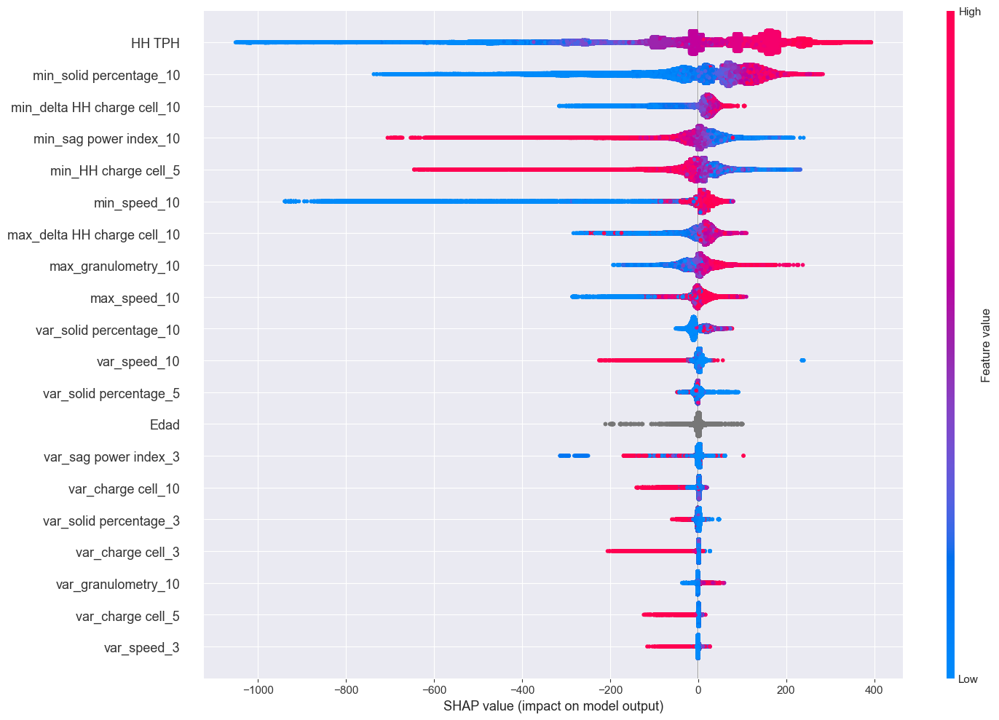

In [68]:
shap.summary_plot(shap_values_Model,Xtrain[tag_select], plot_size=[15,10])

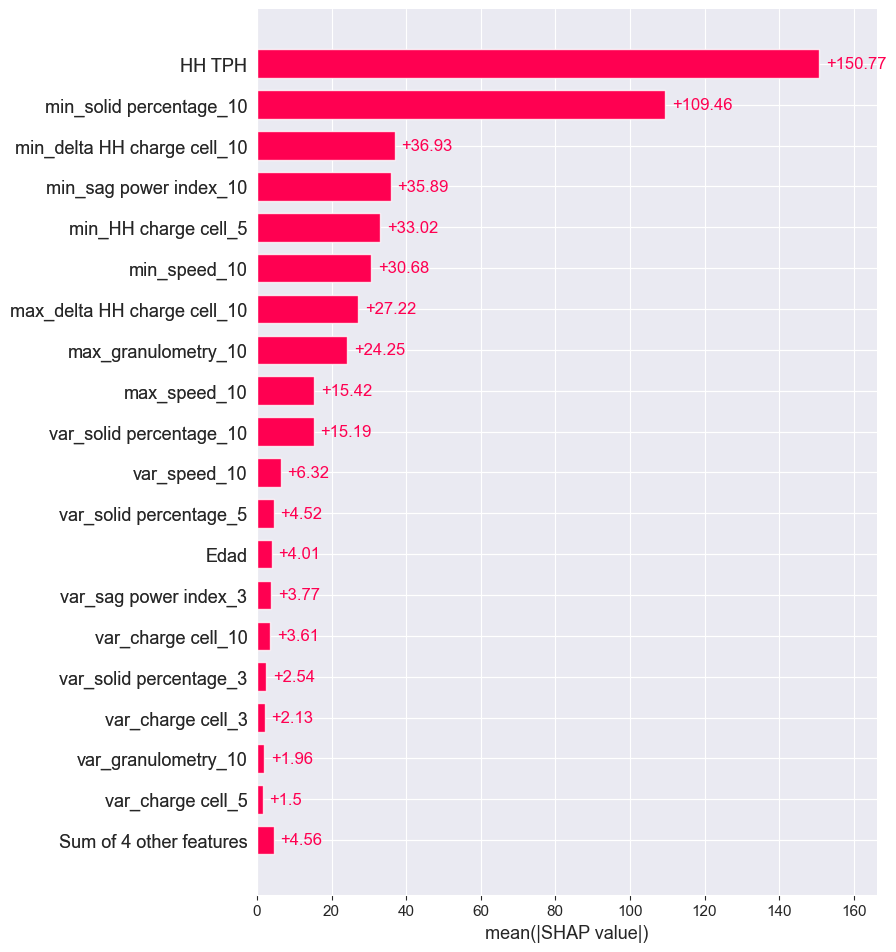

<Figure size 1200x1200 with 0 Axes>

In [69]:
shap.plots.bar(explainerModel_X, max_display=20,)
plt.figure(figsize=(12, 12))
plt.show()